## Synthetic data generation with Amazon Bedrock for visual quality inspection model training

### Introduction

End of Line (EOL) testing that involves visual quality inspection is a critical step in the manufacturing process. The main goal of visual quality inspection is to detect any defects or irregularities that might have occurred during the manufacturing process. This can include issues like surface imperfections (ex. scratches), incorrect assembly or missing components. Visual quality inspection can involve both manual and automated inspection. The automated systems use cameras and machine learning models to perform the visual quality inspection. <br>
 
One of the key challenges when training these machine learning models is the availability of images showing failures of the final product. This is understandable because the companies are normally producing failure-free products. In other words, the dataset of images with failures is small which presents several challenges (ex. data imbalance) that can significantly impact the machine learning model’s performance. To overcome this problem so called foundation models can be used to increase the size of the dataset by generating more images with failures.<br> <span style="color:red"> CAN YOU ELABORATE A BIT MORE WHY A IMBALANCED DATASET MAY NOT BE IDEAL TO TRAIN A VISUAL INSPECTION MODEL </span>

The public dataset used in this notebook contains pictures of mobile phones with 3 types of defects (oil, scratch and strain). We focus only in this notebook on the scratch type. 
https://github.com/jianzhang96/MSD

We'll present 3 different methods how to generate data for visual quality inspection model traing (i.e. images of mobile phones with scratches)
- Directly using zero-shot prompting
- Fine-tuning an existing model
- Using inpainting and masking API offered by Stability AI (Stable Diffusion)

### Initialization


In [ ]:
!pip install opencv-python
!sudo apt update
!sudo apt install -y libgl1-mesa-glx
!pip install opencv-python

In [ ]:
import boto3
import json
from PIL import Image, ImageDraw
import io
from io import BytesIO
import numpy as np
import base64
import os
import math
import matplotlib.pyplot as plt
import cv2
from typing import List

session = boto3.Session()
region = session.region_name
model_id = "stability.stable-diffusion-xl-v1"

# encode_image_from_file (source:modify_image.py)
def encode_image_from_file(image_path):
    with open(image_path, "rb") as image_file:
        return base64.b64encode(image_file.read()).decode('utf-8') # returns a base64-encoded string representation of the image

# encode_image_from_memory
# This function is similar to the previous one, but it works with an in-memory image object rather than a file on disk. 
def encode_image_from_memory(image):
    buffered = io.BytesIO()
    image.save(buffered, format="PNG")
    return base64.b64encode(buffered.getvalue()).decode('utf-8')

# Function to display images inside the notebook
def display_images(*images, titles=None):
    num_images = len(images)
    if num_images == 0 or num_images > 9:
        raise ValueError("This function expects 1 to 9 images")
    
    rows = math.ceil(num_images / 3)
    cols = min(num_images, 3)
    
    fig, axes = plt.subplots(rows, cols, figsize=(7 * cols, 7 * rows))
    
    if num_images == 1:
        axes = np.array([axes])
    
    axes = axes.flatten()
    
    default_titles = ['Image ' + str(i+1) for i in range(9)]
    
    if titles is None:
        titles = default_titles[:num_images]
    elif len(titles) != num_images:
        raise ValueError("Number of titles should match the number of images")
    
    for i, (ax, img, title) in enumerate(zip(axes, images, titles)):
        if isinstance(img, str):
            # Assume it's a base64 encoded string
            img_data = base64.b64decode(img)
            img = Image.open(io.BytesIO(img_data))
        
        if isinstance(img, Image.Image):
            # For PIL Images
            ax.imshow(img)
        elif isinstance(img, np.ndarray):
            # For NumPy arrays
            if img.ndim == 2:
                ax.imshow(img, cmap='gray')
            else:
                ax.imshow(img)
        else:
            raise TypeError(f"Unsupported image type for image {i+1}: {type(img)}")
        
        ax.set_title(title)
        ax.axis('off')
    
    # Hide any unused subplots
    for j in range(i+1, len(axes)):
        axes[j].axis('off')
        axes[j].set_visible(False)
    
    plt.tight_layout()
    plt.show()


### Data preparation - preprocessing of image dimensions 

According to Stability AI documentation, the image pixel limit is 1048576 (1024 x 1024), so technically any dimension is allowable within that amount. If the pixel limit is violated when invoking the model, an error message will be returned that the image size exceeds the maximum allowed pixel limit for processing. So, the first step is to check the image dimensions and resize if it exceeds the pixel limit.

In [ ]:
# Define pixel limit and target dimensions
MAX_PIXELS = 1048576  # 1024 × 1024
TARGET_WIDTH = 1024
TARGET_HEIGHT = 1024

# Resize the image in case the image is exceeding the pixel limit = 1048576
def process_image(image_path, output_path=None):
    """
    Args:
        image_path (str): Path to the input image file
        output_path (str, optional): Path for the resized image. If None, original file will be overwritten
        
    Returns:
        tuple: (width, height, was_resized, total_pixels)
        
    Raises:
        FileNotFoundError: If the image file doesn't exist
        IOError: If the file is not a valid image
    """
    try:
        # Check if file exists
        if not os.path.exists(image_path):
            raise FileNotFoundError(f"Image file not found: {image_path}")
            
        # Open the image
        with Image.open(image_path) as img:
            # Get original dimensions
            original_width, original_height = img.size
            total_pixels = original_width * original_height
            
            # Check if resize is needed
            if total_pixels > MAX_PIXELS:
                # Resize image
                resized_img = img.resize((TARGET_WIDTH, TARGET_HEIGHT), Image.Resampling.LANCZOS)
                
                # Determine output path
                save_path = output_path if output_path else image_path
                
                # Save resized image
                resized_img.save(save_path, quality=95, optimize=True)
                
                return TARGET_WIDTH, TARGET_HEIGHT, True, total_pixels
            
            return original_width, original_height, False, total_pixels
            
    except IOError:
        raise IOError(f"Unable to open image file: {image_path}. File might not be a valid image.")

# Original Image Path
image_path = "0001.png"

# Optional: specify output path for resized image 
output_path = "0001_RESIZED.png"
 
width, height, was_resized, total_pixels = process_image(
            image_path,
            output_path=output_path  # Remove this line to overwrite original
        )

print(f"Original image:")
print(f"Total pixels: {total_pixels:,}")

if was_resized:
    print("\nImage exceeded pixel limit!")
    print(f"Original dimensions: {int(total_pixels ** 0.5)}×{int(total_pixels ** 0.5)}px")
    print(f"\nImage has been resized to:")
    print(f"Width: {width}px")
    print(f"Height: {height}px")
    print(f"New total pixels: {width * height:,}")
    print(f"Saved to: {output_path if output_path else image_path}")
else:
    print("\n✓ Image is within pixel limits")
    print(f"Width: {width}px")
    print(f"Height: {height}px")

### Amazon Bedrock client initialization and image encoding

### <span style="color:red">CAN YOU INCLUDE A FEW WORDS WHAT BEDROCK IS AND WHAT ADVANTAGES IT BRINGS FOR THIS CASE e.g. EASY USAGE OF FMs? </span>

In [29]:
# Initialize the Bedrock client
bedrock = boto3.client(
    service_name='bedrock-runtime',
    region_name=region
)

# Encode the resized image
base64_image = encode_image_from_file(output_path)

### Method 1: Directly using zero-shot prompting 

9 images will be generated using different seeds while using the same prompt. The generated images will be added to a list.

### <span style="color:red">CAN YOU DESCRIBE WHAT ZERO-SHOT PROMPTING IS </span>

In [58]:
generated_images_using_prompt = []
num_images = 9

for i in range(num_images):
    # Prepare the request payload
    payload = {
        "text_prompts": [
            {"text": "Add scratches to the screen of the mobile phone", "weight": 1},
            {"text": "Keep the rest of the image unchanged", "weight": 1}
        ],
        "init_image": base64_image,
        "image_strength": 0.35,  # Adjust this value to control how much of the original image is preserved
        "steps": 50,
        "seed": 44 + i,  # Increment the seed for each image
        "cfg_scale": 7.5,
    }

    # Convert the payload to JSON
    body = json.dumps(payload)

    # Make the API call to Bedrock
    response = bedrock.invoke_model(
        body=body,
        modelId=model_id,
        contentType="application/json",
        accept="application/json"
    )

    # Parse the response
    response_body = json.loads(response['body'].read())

    # The modified image is returned as a base64-encoded string
    generated_image = response_body['artifacts'][0]['base64']
    generated_images_using_prompt.append(generated_image)

    print(f"Generated image using prompt {i+1}/{num_images}")
    

Generated image using prompt 1/9
Generated image using prompt 2/9
Generated image using prompt 3/9
Generated image using prompt 4/9
Generated image using prompt 5/9
Generated image using prompt 6/9
Generated image using prompt 7/9
Generated image using prompt 8/9
Generated image using prompt 9/9


As shown in the images below, the images generated have more than the scratches required. For example, extra buttons that do not exist in the original image have been added. Different parameters have been tuned but the generated images always had more changes than required (ex. buttons disappeared).

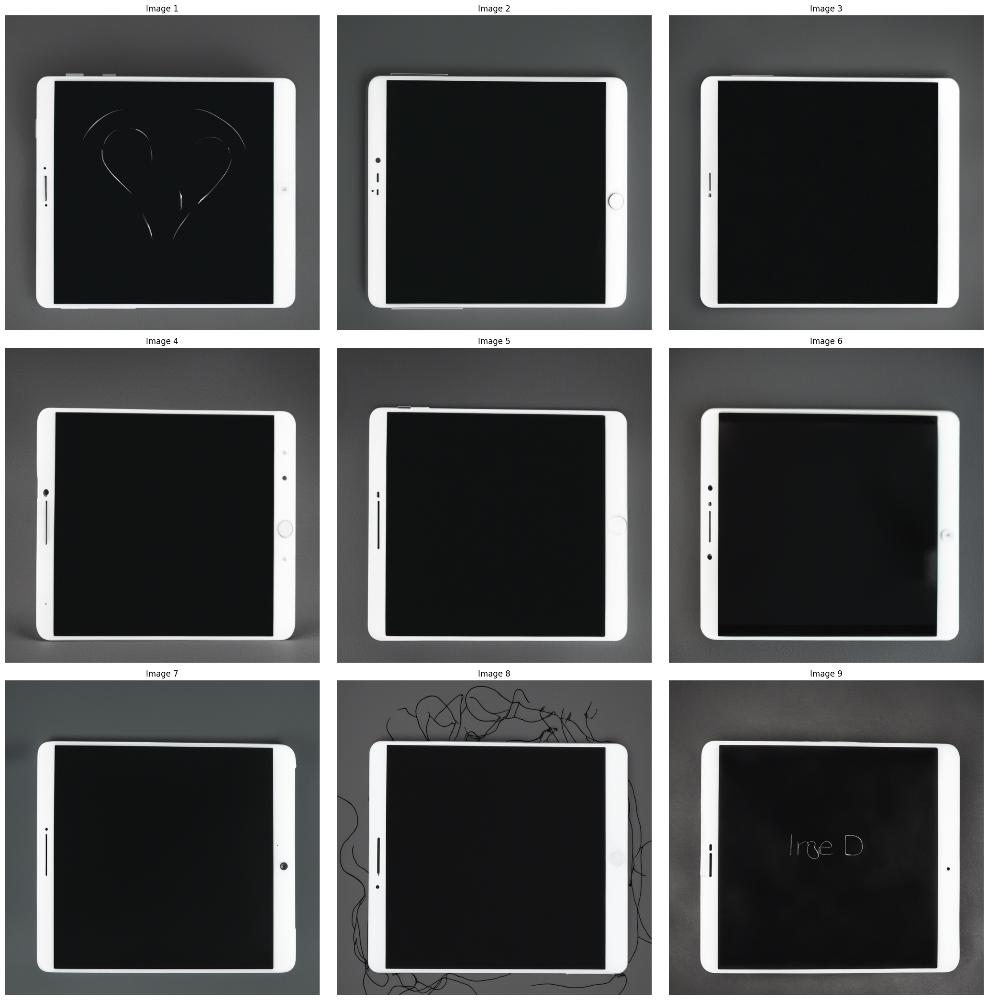

In [59]:
display_images(*generated_images_using_prompt)

### Method 2: Fine-tuning an existing model

Using this [repo](https://github.com/aws/amazon-sagemaker-examples/blob/main/introduction_to_amazon_algorithms/jumpstart_text_to_image/custom_dog_image_generator.ipynb), 20 images were used to fine-tune a model using Amazon SageMaker Jumpstart. A prompt was then used to generate images using prompts like "A mobile phone with scratches placed in the center of the screen". Although the model was able to generate images for mobile phones with scratch on the screen, the generated images were random. For example, one image had 3 cameras and another one was a bit blurry and zoomed in. This creativity/randomness isn't helpful in cases where training data should reflect the failure as consistent as possible to train models for anomaly detection.


### <span style="color:red">PLEASE INCLUDE THE GENERATED IMAGES HERE. CAN YOU INCORPORATE A FEW WORDS WHAT THE AIM OF FINE-TUNING IS IN GENERAL? </span>

### Method 3: Inpainting & Masking followed by postprocessing
Inpainting is a technique that allows for selective modification of an image. It involves masking a specific region of the image and then generating new content within that masked area are based on the provided prompt. 

Generated image using inpainting 1/9
Generated image using inpainting 2/9
Generated image using inpainting 3/9
Generated image using inpainting 4/9
Generated image using inpainting 5/9
Generated image using inpainting 6/9
Generated image using inpainting 7/9
Generated image using inpainting 8/9
Generated image using inpainting 9/9


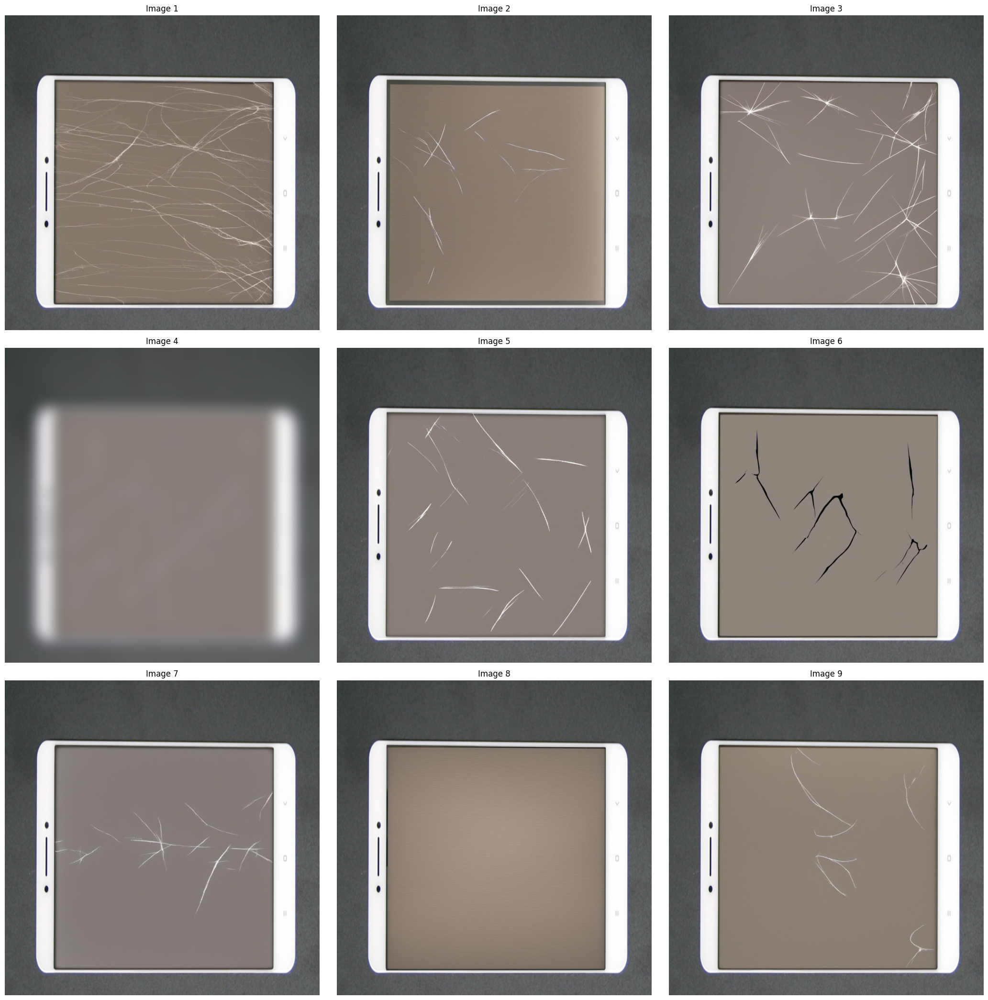

In [76]:
# Open the input image
input_image = Image.open(output_path).convert('RGB')

# Create a mask (you'll need to adjust these coordinates to match your image)
mask = Image.new('RGB', input_image.size, (255, 255, 255)) # (255, 255, 255) represents white
draw = ImageDraw.Draw(mask) #creates a drawing object that allows you to draw on the mask image

# Adjust these coordinates to match your phone's screen area
screen_area = [(164, 214), (870, 940)]  # Example coordinates - This is phone screen coordinates in the picture
draw.rectangle(screen_area, fill=(0, 0, 0))

# Encode the mask image
base64_mask = encode_image_from_memory(mask)

inpaint_prompt = "scratches on a mobile phone screen"

generated_images_using_inpainting = []

for i in range(9):
    payload = {
        "text_prompts":[{"text": inpaint_prompt}],
        "init_image": base64_image,
        "mask_source": "MASK_IMAGE_BLACK", #Black pixels are replaced and white pixels are left unchanged.
        "mask_image": base64_mask,
        "cfg_scale": 10, # (Optional) Determines how much the final image portrays the prompt. Use a lower number to increase randomness in the generation.
        "seed": 10*i,
    }

    body = json.dumps(payload)

    # Make the API call to Bedrock
    response = bedrock.invoke_model(
        body=body,
        modelId="stability.stable-diffusion-xl-v1",
        contentType="application/json",
        accept="application/json"
    )

    response_body = json.loads(response.get("body").read())
    generated_image = response_body["artifacts"][0].get("base64")
    generated_images_using_inpainting.append(generated_image)

    print(f"Generated image using inpainting {i+1}/9")

display_images(*generated_images_using_inpainting)

## Post Processing

Some of the generated images are blurry. In the post-processing stage, there are 2 steps. 
- Detect the blurry images and discard them. 
- To convert the screen's content to a black background while preserving and enhancing visible scratches or marks on the screen.  
<span style="color:red">CAN YOU ELABORATE A BIT MORE ON THE METHOD USED HERE TO UNBLURRY? </span>


### Filter blurry images

In [77]:
def detect_blur(base64_string, threshold=50):
    """
    Detect if a base64 encoded image is blurry.
    Returns True if image is blurry, False otherwise.
    
    Args:
        base64_string: Base64 encoded image string
        threshold: Laplacian variance threshold, lower means more sensitive to blur
    """
    # Decode base64 to image
    img_data = base64.b64decode(base64_string)
    img = Image.open(BytesIO(img_data))
    
    # Convert to OpenCV format
    cv_img = cv2.cvtColor(np.array(img), cv2.COLOR_RGB2BGR)
    
    # Convert to grayscale
    gray = cv2.cvtColor(cv_img, cv2.COLOR_BGR2GRAY)
    
    # Calculate Laplacian variance
    laplacian_var = cv2.Laplacian(gray, cv2.CV_64F).var()
    
    # Return blur detection result
    return laplacian_var < threshold, laplacian_var

def filter_sharp_images(generated_images, threshold=50):
    """
    Filter out blurry images and return a list of sharp images.
    
    Args:
        generated_images: List of base64 encoded image strings
        threshold: Blur detection threshold
    
    Returns:
        List of non-blurry base64 encoded image strings
    """
    sharp_images = []
    blur_scores = []
    
    for idx, img_base64 in enumerate(generated_images):
        is_blurry, score = detect_blur(img_base64, threshold)
        
        if not is_blurry:
            sharp_images.append(img_base64)
            blur_scores.append(score)
            print(f"Image {idx+1}: Sharp (Score: {score:.2f}) - Added to list")
        else:
            print(f"Image {idx+1}: Blurry (Score: {score:.2f}) - Filtered out")
    
    print(f"\nTotal images processed: {len(generated_images)}")
    print(f"Sharp images kept: {len(sharp_images)}")
    print(f"Blurry images filtered out: {len(generated_images) - len(sharp_images)}")
    
    # Print blur scores of kept images
    if sharp_images:
        print("\nBlur scores of kept images:")
        for idx, score in enumerate(blur_scores):
            print(f"Sharp image {idx+1}: {score:.2f}")
    
    return sharp_images

def process_generated_images(generated_images_using_inpainting, threshold=50):
    """
    Process the generated images and filter out blurry ones.
    
    Args:
        generated_images_using_inpainting: List of base64 encoded image strings
        threshold: Blur detection threshold
    """
    print("Processing generated images...")
    sharp_images = filter_sharp_images(
        generated_images_using_inpainting,
        threshold=threshold
    )
    
    return sharp_images


In [78]:
# Process the images
sharp_images = process_generated_images(
    generated_images_using_inpainting,
    threshold=50  # Adjust this value based on your needs
)

# Now sharp_images contains only the non-blurry base64 strings
print(f"\nNumber of sharp images: {len(sharp_images)}")

Processing generated images...
Image 1: Sharp (Score: 106.07) - Added to list
Image 2: Sharp (Score: 83.54) - Added to list
Image 3: Sharp (Score: 180.21) - Added to list
Image 4: Blurry (Score: 0.40) - Filtered out
Image 5: Sharp (Score: 102.01) - Added to list
Image 6: Sharp (Score: 105.98) - Added to list
Image 7: Sharp (Score: 93.65) - Added to list
Image 8: Sharp (Score: 63.38) - Added to list
Image 9: Sharp (Score: 80.15) - Added to list

Total images processed: 9
Sharp images kept: 8
Blurry images filtered out: 1

Blur scores of kept images:
Sharp image 1: 106.07
Sharp image 2: 83.54
Sharp image 3: 180.21
Sharp image 4: 102.01
Sharp image 5: 105.98
Sharp image 6: 93.65
Sharp image 7: 63.38
Sharp image 8: 80.15

Number of sharp images: 8


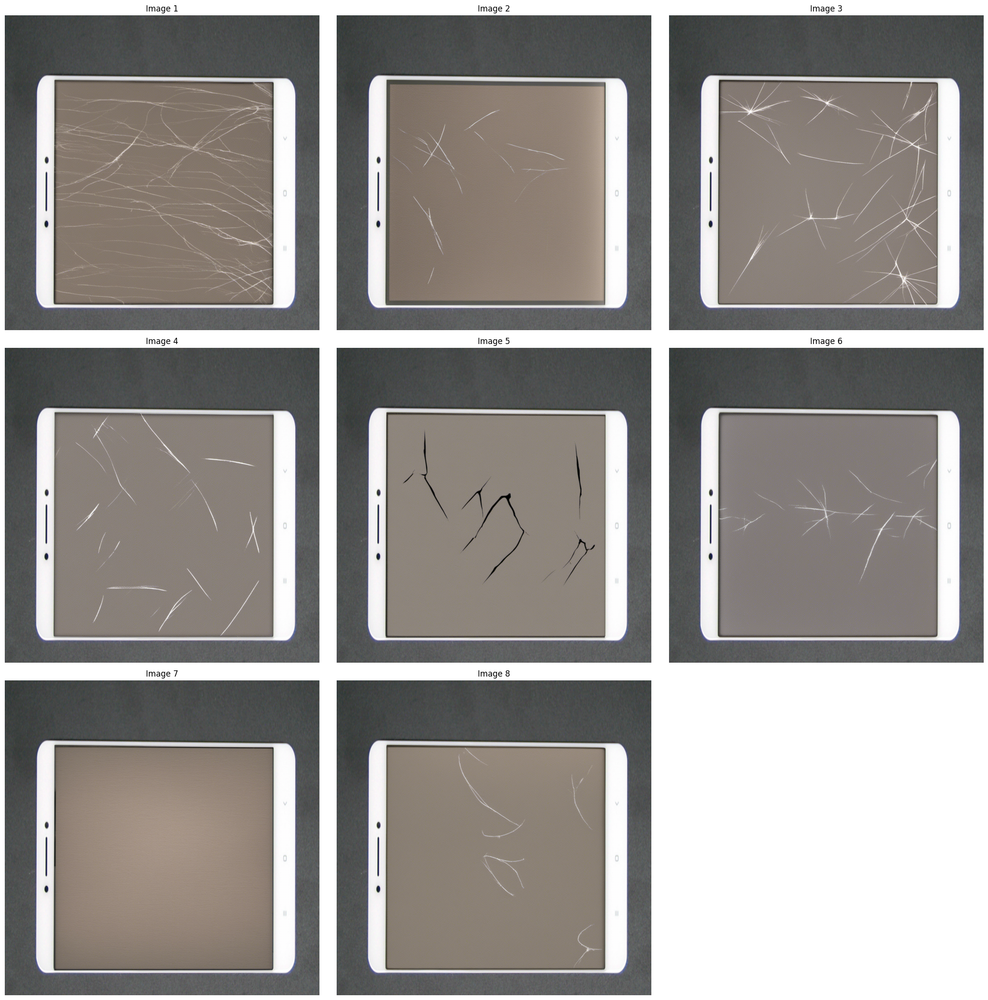

In [79]:
display_images(*sharp_images)

### Convert to black background
Now, the final step is to convert the screen's content to a black background while preserving and enhancing visible scratches as mentioned earlier.

In [80]:
def post_processing_batch(input_base64_list: List[str]) -> List[str]:
    """
    Change the color of the screen in multiple images to black while preserving clear scratches.
    
    :param input_base64_list: List[str], list of base64 encoded strings of input images
    :return: List[str], list of base64 encoded strings of processed images
    """
    processed_images = []
    
    for idx, input_base64 in enumerate(input_base64_list):
        try:
            # Decode the base64 string to image data
            image_data = base64.b64decode(input_base64)
            img = Image.open(io.BytesIO(image_data))
            
            # Create a mask for the screen area
            mask = Image.new('L', img.size, 0)
            draw = ImageDraw.Draw(mask)
            screen_coords = [(164, 214), (870, 940)]  # Adjust if needed
            draw.rectangle(screen_coords, fill=255)
            
            # Extract the screen area
            screen = Image.new('RGB', img.size, (0, 0, 0))
            screen.paste(img, (0, 0), mask)
            
            # Convert screen to black but keep clear scratches
            screen_data = screen.load()
            width, height = screen.size
            for x in range(width):
                for y in range(height):
                    r, g, b = screen_data[x, y]
                    brightness = (r + g + b) / 3
                    if brightness > 200:  # Only keep very bright pixels as scratches
                        screen_data[x, y] = (255, 255, 255)  # Make scratches white for clarity
                    else:
                        screen_data[x, y] = (0, 0, 0)  # Set to black
            
            # Paste the modified screen back onto the original image
            img.paste(screen, (0, 0), mask)
            
            # Save the result to a bytes buffer
            buffer = io.BytesIO()
            img.save(buffer, format="PNG")
            
            # Encode the image to base64
            output_base64 = base64.b64encode(buffer.getvalue()).decode('utf-8')
            processed_images.append(output_base64)
            
            #print(f"Processed image {idx + 1}/{len(input_base64_list)}")
            
        except Exception as e:
            print(f"Error processing image {idx + 1}: {str(e)}")
            processed_images.append(None)  # Add None for failed processing
    
    # Remove any None values from failed processing
    processed_images = [img for img in processed_images if img is not None]
    
    print(f"\nTotal images processed: {len(processed_images)}")
    return processed_images

In [81]:
final_images = post_processing_batch(sharp_images)


Total images processed: 8


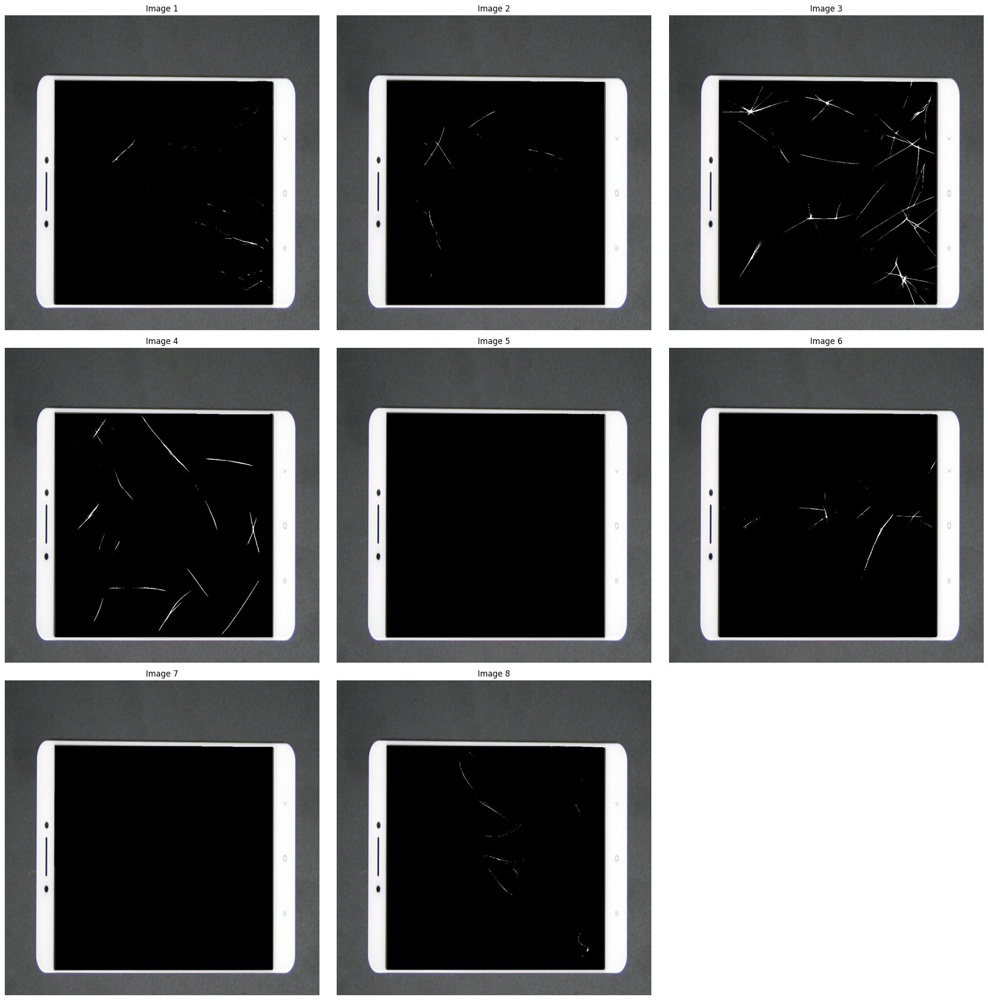

In [83]:
display_images(*final_images)


## Limitations and future work
It is worth noting that some of the generated images (even after the post processing) do not have any scratches (ex. images 5, 7). This highlights the non-deterministic nature of the outputs of generative AI models and it is an area where further post-processing can be examined (for example, to exclude any pictures with complete black screens).

<span style="color:red"> Please include - scaling images back to original size - filtering of all black screen images </span>